# About the Data

https://www.kaggle.com/competitions/digit-recognizer/data

Each image is stored as pixels 0 through 783 (28x28 image) in a CSV file where each row is a separate image.\
The first column in each row is the label (0-9) and the rest are the pixels (0-255 where 0 is white and 255 is black).

Each image takes the following format:

000 001 002 003 ... 026 027\
028 029 030 031 ... 054 055\
056 057 058 059 ... 082 083\
... ... ... ... ... ... ...\
728 729 730 731 ... 754 755\
756 757 758 759 ... 782 783

# Load the Data

In [2]:
import pandas as pd
import plotly.express as px
import random

In [6]:
digits = pd.read_csv('train.csv')
test_digits = pd.read_csv('test.csv')

# Make Observations

In [7]:
digits.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
# Find the number of samples per digit
counts = digits["label"].value_counts().sort_index()
count_fig = px.bar(counts, x=counts.index, y=counts.values, labels={"index": "Digit", "y": "Count"}, title="Number of Samples per Digit")
count_fig.show()

In [9]:
def cols_to_coords():
    colnames = {}
    pixel_num = 0
    for i in range(0, 28):
        for j in range(0, 28):
            colnames[f'pixel{pixel_num}'] = f'{i},{j}'
            pixel_num += 1
    return colnames

In [10]:
# show an example of a digit (we will use 8)
one_digit = digits[digits["label"] == 8].iloc[1]

colnames = cols_to_coords()
one_digit = one_digit.rename(colnames).reset_index()

col = one_digit.columns[1]
one_digit = one_digit.rename(columns={"index": "pixel", col: "brightness"})

one_digit[['x', 'y']] = one_digit['pixel'].str.split(',', expand=True).rename(columns={0: "x", 1: "y"})
one_digit = one_digit.drop(columns=["pixel"])

one_digit = one_digit.pivot_table(index='x', columns='y', values='brightness', sort=False)

one_digit_heatmap = px.imshow(one_digit, color_continuous_scale='gray_r', title="Heatmap of One Digit")
one_digit_heatmap.show()

In [11]:
# show heatmap of average brightness of 8s (can be any digit)
eight = digits[digits['label'] == 8]

colnames = cols_to_coords()
eight = eight.rename(columns=colnames).drop('label', axis=1)

eight = eight.mean(axis=0).reset_index().rename(columns={'index': 'pixel', 0: 'brightness'})
eight[["x","y"]] = eight["pixel"].str.split(",", expand=True).rename(columns={0: "x", 1: "y"})
eight = eight.drop('pixel', axis=1)

eight = eight.pivot_table(index='x', columns='y', values='brightness', sort=False)

heatmap = px.imshow(eight, color_continuous_scale='gray_r', title='Average Brightness of 8s')
heatmap.show()


In [12]:
two = digits[digits['label'] == 2]

two = two.rename(columns=colnames).drop('label', axis=1)

two = two.mean(axis=0).reset_index().rename(columns={'index': 'pixel', 0: 'brightness'})
two[['x', 'y']] = two['pixel'].str.split(',', expand=True).rename(columns={0: 'x', 1: 'y'})
two = two.drop('pixel', axis=1)

two = two.pivot_table(index='x', columns='y', values='brightness', sort=False)

two_heatmap = px.imshow(two, color_continuous_scale='gray_r', title='Average Brightness of 2s')
two_heatmap.show()

In [13]:
digits["percent black pixels"] = digits.drop("label", axis=1, inplace=False).apply(lambda row: (sum(row != 0) / 784) * 100, axis=1)

black = px.box(digits, x='label', y='percent black pixels', labels={"label": "Digit"}, title='Percent of Black Pixels in Each Digit')
black.show()

In [14]:
digits["percent white pixels"] = digits.drop("label", axis=1, inplace=False).apply(lambda row: (sum(row == 0) / 784) * 100, axis=1)

white = px.box(digits, x='label', y='percent white pixels', labels={"label": "Digit"}, title='Percent of White Pixels in Each Digit')
white.show()

In [15]:
# Graph black pixels vs white pixels
black_vs_white = px.scatter(digits, x='percent black pixels', y='percent white pixels', color='label', labels={"label": "Digit"}, title='Percent of Black Pixels vs White Pixels')
black_vs_white.show()

In [16]:
# symmetry functions
def horizontal_symmetry(row):
    matrix = row.to_numpy().reshape(28, 28)
    count = 0
    for i in range(0, 28):
        for j in range(0, 14):
            if matrix[i][j] == matrix[i][28 - j - 1] and (matrix[i][j] != 0 and matrix[i][28 - j - 1] != 0):
                count += 1
    return count / (784 / 2) * 100
                
        
def vertical_symmetry(row):
    matrix = row.to_numpy().reshape(28, 28)
    count = 0
    for i in range(0, 14):
        for j in range(0, 28):
            if matrix[i][j] == matrix[28 - i - 1][j] and (matrix[i][j] != 0 and matrix[28 - i - 1][j] != 0):
                count += 1
                
    return count / (784 / 2) * 100
        

In [17]:
# TODO: horizontal symmetry --> loosen up the exact match requirement
digits["percent horizontal symmetry"] = digits.drop(["label", "percent black pixels", "percent white pixels"], axis=1, inplace=False).apply(horizontal_symmetry, axis=1)

horizontal_symmetry = px.box(digits, x='label', y='percent horizontal symmetry', labels={"label": "Digit"}, title='Percent of Horizontal Symmetry in Each Digit')
horizontal_symmetry.show()

In [18]:
# TODO: vertical symmetry --> loosen up the exact match requirement
digits["percent vertical symmetry"] = digits.drop(["label", "percent black pixels", "percent horizontal symmetry", "percent white pixels"], axis=1, inplace=False).apply(vertical_symmetry, axis=1)

vertical_symmetry = px.box(digits, x='label', y='percent vertical symmetry', labels={"label": "Digit"}, title='Percent of Vertical Symmetry in Each Digit')
vertical_symmetry.show()

In [19]:
digits.describe()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,percent black pixels,percent white pixels,percent horizontal symmetry,percent vertical symmetry
count,42000.000000,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,42000.0,...,42000.000000,42000.000000,42000.0,42000.0,42000.0,42000.0,42000.000000,42000.000000,42000.000000,42000.000000
mean,4.456643,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.017238,0.002857,0.0,0.0,0.0,0.0,19.152964,80.847036,1.991484,1.745347
std,2.887730,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.894498,0.414264,0.0,0.0,0.0,0.0,5.298041,5.298041,2.149293,1.982542
min,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,4.336735,55.229592,0.000000,0.000000
25%,2.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,15.561224,77.295918,0.510204,0.510204
50%,4.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,19.132653,80.867347,1.275510,1.020408
75%,7.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.0,0.0,0.0,22.704082,84.438776,2.806122,2.295918
max,9.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,254.000000,62.000000,0.0,0.0,0.0,0.0,44.770408,95.663265,26.275510,25.255102


In [20]:
def add_random_noise(val):
    return val + 0.25 * random.random()

In [21]:
# TODO: VS vs HS for easily confused digits
one_and_seven = digits[(digits['label'] == 1) | (digits['label'] == 7)]
pct_vert_sym = one_and_seven['percent vertical symmetry'].apply(add_random_noise)
# pct_horiz_sym = one_and_seven['percent horizontal symmetry'].apply(add_random_noise)

# one_and_seven = one_and_seven.assign(noisy_percent_vertical_symmetry=pct_vert_sym, noisy_percent_horizontal_symmetry=pct_horiz_sym).rename(columns={"noisy_percent_vertical_symmetry": "noisy percent vertical symmetry", "noisy_percent_horizontal_symmetry": "noisy percent horizontal symmetry"})
one_and_seven = one_and_seven.assign(noisy_percent_vertical_symmetry=pct_vert_sym).rename(columns={"noisy_percent_vertical_symmetry": "noisy percent vertical symmetry"})

one_seven_fig = px.scatter(one_and_seven, x='noisy percent vertical symmetry', y='percent horizontal symmetry', range_x=(0, 8), range_y=(0, 12), color='label', title='Vertical Symmetry vs Horizontal Symmetry for 1s and 7s')
one_seven_fig.show()

In [22]:
# TODO: VS vs Black Pixels for easily confused digits
one_and_seven_2 = digits[(digits['label'] == 1) | (digits['label'] == 7)]
pct_vert_sym = one_and_seven_2['percent vertical symmetry'].apply(add_random_noise)
# pct_black_pixels = six_and_nine['percent black pixels'].apply(add_random_noise)

# six_and_nine = six_and_nine.assign(noisy_percent_vertical_symmetry=pct_vert_sym, noisy_percent_black_pixels=pct_black_pixels).rename(columns={"noisy_percent_vertical_symmetry": "noisy percent vertical symmetry", "noisy_percent_black_pixels": "noisy percent black pixels"})
one_and_seven_2 = one_and_seven_2.assign(noisy_percent_vertical_symmetry=pct_vert_sym).rename(columns={"noisy_percent_vertical_symmetry": "noisy percent vertical symmetry"})

six_nine_fig = px.scatter(one_and_seven_2, x='noisy percent vertical symmetry', y='percent black pixels', range_x=(0, 10), color='label', title='Vertical Symmetry vs Black Pixels for 1s and 7s')
six_nine_fig.show()

In [23]:
vert_symm_black_pixels = px.scatter(digits, x='percent vertical symmetry', y='percent black pixels', color='label', title='Vertical Symmetry vs Black Pixels')
vert_symm_black_pixels.show()

# Our Model

In [24]:
# trying a custom KNN algorithm
k = 30
digits.sort_values(by=['percent black pixels', 'percent horizontal symmetry'], inplace=True)
digits_train = digits.to_numpy()

num_correct = 0
for i in range(0, len(digits_train)):
    neighbors = []
    counts = {}
    for j in range(1, k // 2):
        if i + j < len(digits_train):
            neighbors.append(digits_train[i + j])
        if i - j >= 0:
            neighbors.append(digits_train[i - j])
    for n in neighbors:
        if n[0] in counts:
            counts[n[0]] += 1
        else:
            counts[n[0]] = 1
    max_label = max(counts, key=counts.get)
    if max_label == digits_train[i][0]:
        num_correct += 1

print(f"KNN with k = {k}: {num_correct / len(digits_train) * 100:0.2f}% accurate")

KNN with k = 30: 25.50% accurate


In [25]:
from sklearn import linear_model

# black box linear regression model
X = digits[['percent black pixels']].tail(-1)
y = digits[['label']].tail(-1)

regr = linear_model.LinearRegression()
regr.fit(X.values, y.values)

predictions = regr.predict(digits[['percent black pixels']].tail(-1).values)

for i in range(0, len(predictions)):
    predictions[i][0] = round(predictions[i][0])
    
num_correct = 0
for i in range(0, len(predictions)):
    if predictions[i][0] == digits['label'][i + 1]:
        num_correct += 1

print(f"Blackbox Linear Regression: {num_correct / len(predictions) * 100:0.2f}% accurate")

ModuleNotFoundError: No module named 'sklearn'

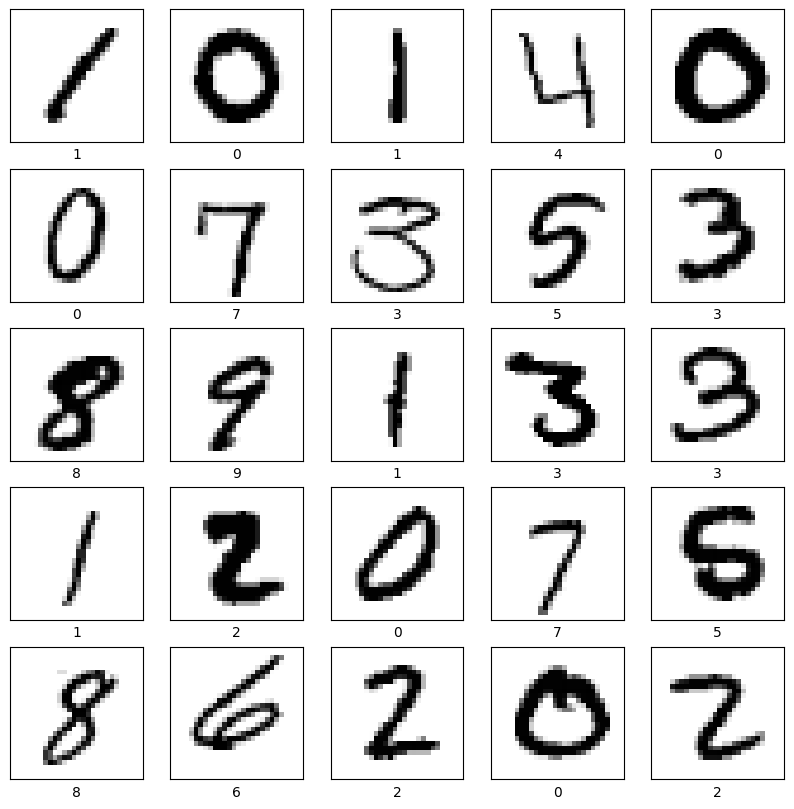

Epoch 1/10
1050/1050 [==============================] - 28s 26ms/step - loss: 0.2026 - accuracy: 0.9363 - val_loss: 0.0663 - val_accuracy: 0.9783
Epoch 2/10
1050/1050 [==============================] - 27s 26ms/step - loss: 0.0593 - accuracy: 0.9814 - val_loss: 0.0492 - val_accuracy: 0.9848
Epoch 3/10
1050/1050 [==============================] - 28s 26ms/step - loss: 0.0412 - accuracy: 0.9870 - val_loss: 0.0525 - val_accuracy: 0.9848
Epoch 4/10
1050/1050 [==============================] - 27s 25ms/step - loss: 0.0327 - accuracy: 0.9894 - val_loss: 0.0445 - val_accuracy: 0.9873
Epoch 5/10
1050/1050 [==============================] - 27s 25ms/step - loss: 0.0275 - accuracy: 0.9911 - val_loss: 0.0481 - val_accuracy: 0.9871
Epoch 6/10
1050/1050 [==============================] - 27s 26ms/step - loss: 0.0215 - accuracy: 0.9927 - val_loss: 0.0391 - val_accuracy: 0.9882
Epoch 7/10
1050/1050 [==============================] - 27s 25ms/step - loss: 0.0181 - accuracy: 0.9939 - val_loss: 0.0414 -

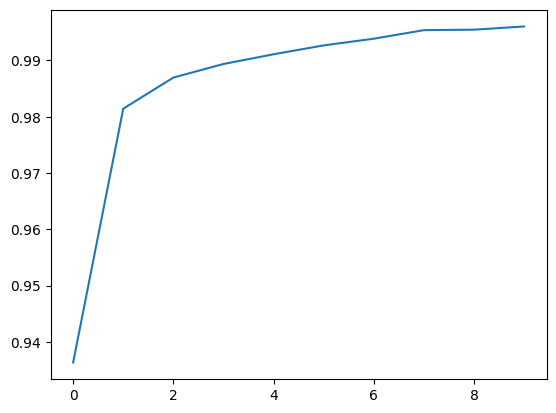

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd

from tensorflow.python.keras import layers, models
import matplotlib.pyplot as plt

digits = pd.read_csv("train.csv")
digits_features = digits.copy()
digits_labels = digits_features.pop('label')

digits_features = np.array(digits_features)
digits_features = digits_features / 255.0

class_names = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)

    plt.imshow(digits_features[i].reshape(28, 28), cmap=plt.cm.binary)
    plt.xlabel(class_names[digits_labels[i]])
plt.show()

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(10))

model.compile(optimizer='adam', loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['accuracy'])

history = model.fit(digits_features.reshape(42000, 28, 28, 1), digits_labels, epochs=10, validation_split=0.2)

In [ ]:
# evaluate the NN model
plt.plot(history.history['accuracy'], label='accuracy', title='Accuracy vs Epochs')

test_loss, test_acc = model.evaluate(digits_features.reshape(42000, 28, 28, 1), digits_labels, verbose=2)

print("Neural Network Accuracy: " + test_acc + "%")

In [ ]:
# plot misclassified images
num_incorrect = 0
for i in range(0, len(digits_features)):
    if digits_features[i][0] != digits_labels[i]:
        num_incorrect += 1

print(num_incorrect)

### Clustering (K-Means)

In [7]:
# importing again
import numpy as np

In [15]:
# refresh data
digits = pd.read_csv('train.csv')
test_digits = pd.read_csv('test.csv')

digits["cluster"] = np.nan

In [30]:
clusters = pd.DataFrame()
for i in range(0, 10):
    clusters = pd.concat([clusters, digits[digits['label'] == i].sample(1)])
clusters.index = range(0, 10)
    
clusters.drop(columns=['label'], inplace=True)

for i in range(0, 20):
    for row in digits.iterrows():
        min_dist = float('inf')
        min_index = 0
        for j in range(0, 10):
            dist = np.linalg.norm(row[1][1:785].to_numpy() - clusters.iloc[j][:784].to_numpy())
            if dist < min_dist:
                digits.at[row[0], 'cluster'] = j
                min_dist = dist
                min_index = j
        
    pixel_sum = 0.0
    num_rows = 0.0
    for j in range(0, 10):
        for row in digits.iterrows():
            if row[1]['cluster'] == j:
                pixel_sum += row[1][1:785]
                num_rows += 1.0
        clusters.iloc[j][:784] = pixel_sum / num_rows

/var/folders/0y/04k2xbss16xb20t2bdnctmh00000gp/T/ipykernel_86294/2871400522.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  clusters.iloc[j][:784] = pixel_sum / num_rows


In [34]:
# calculate accuracy
num_correct = 0
for row in digits.iterrows():
    if row[1]['cluster'] == row[1]['label']:
        num_correct += 1

print(f"K-Means Accuracy: {num_correct / len(digits) * 100:0.2f}% accurate")

K-Means Accuracy: 41.78% accurate


In [32]:
# plot clusters
cluster_fig = px.scatter(digits, x='label', y='cluster', color='label', title='Cluster vs Label')
cluster_fig.show()